In [1]:
import pandas as pd
import numpy as np
%matplotlib inline
import sklearn.model_selection as cv
import sklearn

import warnings; warnings.simplefilter('ignore')

# 1. Import data and transform to numeric values

In [2]:
## Load dataset
data = pd.read_csv("datapreprocessed.csv", encoding='latin1')
data.head()

,gender,created,description_length,fav_number,link_color,name_length,retweet_count,sidebar_color,text_length,tweet_coord,tweet_count,tweet_created,tweet_location,user_timezone
0,male,early_morning,21,0,cyan,7,0,white,109,False,110964,midday,Unknown,Chennai
1,male,midday,62,68,gray,11,0,white,139,False,7471,midday,Unknown,Eastern Time (US & Canada)
2,male,morning,35,7696,gray,14,1,white,80,False,5617,midday,India,Belgrade
3,male,evening,146,202,gray,11,0,white,138,False,1693,midday,United States,Pacific Time (US & Canada)
4,female,midday,160,37318,lightblue,12,0,black,95,False,31462,midday,Unknown,Unknown


In [3]:
def expand_categoric_column_with_binary_values(column_name):
    global data
    print(column_name)
    print(data[column_name].unique())
    data = pd.concat([
            data.drop(column_name, axis=1),
            pd.get_dummies(data[column_name], prefix=column_name, sparse=True)
        ], axis=1)

expand_categoric_column_with_binary_values('created')
expand_categoric_column_with_binary_values('tweet_created')
expand_categoric_column_with_binary_values('link_color')
expand_categoric_column_with_binary_values('sidebar_color')
expand_categoric_column_with_binary_values('tweet_location')
expand_categoric_column_with_binary_values('user_timezone')

data.head()

created
['early_morning' 'midday' 'morning' 'evening' 'afternoon']
tweet_created
['midday']
link_color
['cyan' 'gray' 'lightblue' 'lightred' 'blue' 'black' 'violet' 'red'
 'orange' 'brown' 'green' 'lightgreen' 'white' 'yellow']
sidebar_color
['white' 'black' 'lightblue' 'orange' 'lightgreen' 'gray' 'lightred' 'cyan'
 'red' 'brown' 'blue' 'yellow' 'violet' 'green']
tweet_location
['Unknown' 'India' 'United States' 'United Kingdom' 'Canada' 'Haiti'
 'Saudi Arabia' 'Venezuela' 'Italy' 'Malaysia' 'Ireland' 'Poland' 'Spain'
 'Belgium' 'Nigeria' 'Portugal' 'South Africa' 'New Zealand' 'France'
 'Lebanon' 'Dominican Republic' 'Germany' 'Australia' 'Czechia' 'Croatia'
 'Indonesia' 'Swaziland' 'Paraguay' 'Mexico' 'Ecuador' 'South Korea'
 'Turkey' 'Syria' 'Greenland' 'Botswana' 'Brazil' 'Tunisia' 'Colombia'
 'Greece' 'Trinidad and Tobago' 'Bangladesh' 'Somalia' 'Netherlands'
 'Sweden' 'Hong Kong' 'Argentina' 'Japan' 'Egypt' 'Israel' 'Bolivia'
 'Bosnia & Herzegovina' 'Sri Lanka' 'North Africa' 'U

,gender,description_length,fav_number,name_length,retweet_count,text_length,tweet_coord,tweet_count,created_afternoon,created_early_morning,...,user_timezone_Urumqi,user_timezone_Vienna,user_timezone_Vilnius,user_timezone_Volgograd,user_timezone_Warsaw,user_timezone_Wellington,user_timezone_West Central Africa,user_timezone_Yakutsk,user_timezone_Yerevan,user_timezone_Zagreb
0,male,21,0,7,0,109,False,110964,0,1,...,0,0,0,0,0,0,0,0,0,0
1,male,62,68,11,0,139,False,7471,0,0,...,0,0,0,0,0,0,0,0,0,0
2,male,35,7696,14,1,80,False,5617,0,0,...,0,0,0,0,0,0,0,0,0,0
3,male,146,202,11,0,138,False,1693,0,0,...,0,0,0,0,0,0,0,0,0,0
4,female,160,37318,12,0,95,False,31462,0,0,...,0,0,0,0,0,0,0,0,0,0


In [4]:
def boolean_to_binary(column_name):
    global data
    data[column_name] = data[column_name].apply(lambda boolean: int(boolean))

boolean_to_binary('tweet_coord')

data.tweet_coord.sum()

157

In [5]:
# All values must be numeric, label included
def genderToNumeric(gender) :
    if gender == 'male' :
        return 0
    elif gender == 'female' :
        return 1
    else :
        return 2


labels = data.gender.apply(lambda g: genderToNumeric(g))
datadt = data.drop('gender', axis=1)

print(data.shape)
datadt.head()

(18836, 332)


,description_length,fav_number,name_length,retweet_count,text_length,tweet_coord,tweet_count,created_afternoon,created_early_morning,created_evening,...,user_timezone_Urumqi,user_timezone_Vienna,user_timezone_Vilnius,user_timezone_Volgograd,user_timezone_Warsaw,user_timezone_Wellington,user_timezone_West Central Africa,user_timezone_Yakutsk,user_timezone_Yerevan,user_timezone_Zagreb
0,21,0,7,0,109,0,110964,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1,62,68,11,0,139,0,7471,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,35,7696,14,1,80,0,5617,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,146,202,11,0,138,0,1693,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,160,37318,12,0,95,0,31462,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [6]:
# Cross-validation: split data into training and test sets (test 30% of data)
data_train, data_test, labels_train, labels_test = cv.train_test_split(datadt, labels, test_size=.3, random_state=1)

# 2. Implement DT without parameters optimization

In [8]:
from sklearn import tree
from sklearn.externals.six import StringIO  
import pydot
from IPython.display import Image 
from statsmodels.stats.proportion import proportion_confint

clf = tree.DecisionTreeClassifier(criterion='entropy')
pred = clf.fit(data_train, labels_train).predict(data_test)
print(sklearn.metrics.confusion_matrix(labels_test, pred))
print()
print("Accuracy on test set:", sklearn.metrics.accuracy_score(labels_test, pred))
print()
print(sklearn.metrics.classification_report(labels_test, pred))
epsilon = sklearn.metrics.accuracy_score(labels_test, pred)
print("Confidence interval: ",proportion_confint(count=epsilon*data_test.shape[0], nobs=data_test.shape[0], alpha=0.05, method='binom_test'))

[[ 795  636  384]
 [ 693 1011  327]
 [ 441  359 1005]]

Accuracy on test set: 0.497434082463

             precision    recall  f1-score   support

          0       0.41      0.44      0.42      1815
          1       0.50      0.50      0.50      2031
          2       0.59      0.56      0.57      1805

avg / total       0.50      0.50      0.50      5651

Confidence interval:  (0.48433824209341136, 0.5105296552032735)


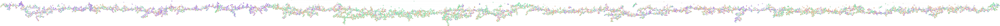

In [32]:
dot_data = StringIO() 
tree.export_graphviz(clf, out_file=dot_data,    
                         filled=True, rounded=True,
                         feature_names=list(datadt.columns.values),
                         class_names=['male', 'female', 'brand'])  
graph = pydot.graph_from_dot_data(dot_data.getvalue())  
graph[0].write_pdf('DT1a.pdf')
Image(graph[0].create_png())  

# 3. Implement DT with parameters optimization

In [9]:
from sklearn.model_selection import GridSearchCV
params = {'min_impurity_split': list(np.linspace(0,1,21)),'min_samples_split':list(range(2,102,11))}
clf = GridSearchCV(tree.DecisionTreeClassifier(criterion='entropy'), param_grid=params,cv=10,n_jobs=-1)  # If cv is integer, by default is Stratifyed 
clf.fit(data_train, labels_train)
print("Best Params=",clf.best_params_, "Accuracy=", clf.best_score_)

Best Params= {'min_impurity_split': 1.3, 'min_samples_split': 101} Accuracy= 0.518998862344


In [16]:
from sklearn import tree
from sklearn.externals.six import StringIO  
import pydot
from IPython.display import Image 
from statsmodels.stats.proportion import proportion_confint

# clf = tree.DecisionTreeClassifier(criterion='entropy', min_samples_split=clf.best_params_['min_samples_split'], min_impurity_split=clf.best_params_['min_impurity_split'])
clf = tree.DecisionTreeClassifier(criterion='entropy', min_samples_split=101, min_impurity_split=1.3)
pred = clf.fit(data_train, labels_train).predict(data_test)
print(sklearn.metrics.confusion_matrix(labels_test, pred))
print()
print("Accuracy on test set:", sklearn.metrics.accuracy_score(labels_test, pred))
print()
print(sklearn.metrics.classification_report(labels_test, pred))
epsilon = sklearn.metrics.accuracy_score(labels_test, pred)
print("Confidence interval: ",proportion_confint(count=epsilon*data_test.shape[0], nobs=data_test.shape[0], alpha=0.05, method='binom_test'))

[[ 696  770  349]
 [ 556 1164  311]
 [ 378  322 1105]]

Accuracy on test set: 0.524685896302

             precision    recall  f1-score   support

          0       0.43      0.38      0.40      1815
          1       0.52      0.57      0.54      2031
          2       0.63      0.61      0.62      1805

avg / total       0.52      0.52      0.52      5651

Confidence interval:  (0.5114145000310439, 0.5375173550842935)


# 4. K-Fold-Cross-Validation

In [55]:
from sklearn import tree
from sklearn.externals.six import StringIO  
import pydot
from IPython.display import Image 
from statsmodels.stats.proportion import proportion_confint
import sklearn.cross_validation as cv

sum_accuracy = 0
sum_conf_interval = [0, 0]

kf = cv.KFold(len(datadt), n_folds=10)

for train_index, test_index in kf :

    data_train, data_test = pd.core.frame.DataFrame(datadt, index = train_index), pd.core.frame.DataFrame(datadt ,index = test_index)
    labels_train, labels_test = pd.core.frame.DataFrame(labels, index = train_index), pd.core.frame.DataFrame(labels ,index = test_index)
    
    clf = tree.DecisionTreeClassifier(criterion='entropy', min_samples_split=101, min_impurity_split=1.3)
    pred = clf.fit(data_train, labels_train).predict(data_test)
    
    epsilon = sklearn.metrics.accuracy_score(labels_test, pred)
    conf_interval = proportion_confint(count=epsilon*data_test.shape[0], nobs=data_test.shape[0], alpha=0.05, method='binom_test')  
    
    sum_accuracy += sklearn.metrics.accuracy_score(labels_test, pred)
    sum_conf_interval[0] += conf_interval[0]
    sum_conf_interval[1] += conf_interval[1]
    
    
print("Accuracy on test set:", sum_accuracy/kf.n_folds)
print()
print(f'Confidence interval: ({sum_conf_interval[0]/kf.n_folds}, {sum_conf_interval[1]/kf.n_folds})')



Accuracy on test set: 0.523724423352

Confidence interval: (0.501108396008749, 0.5462294196995199)


In [17]:
from io import StringIO
dot_data = StringIO() 
tree.export_graphviz(clf, out_file=dot_data,    
                         filled=True, rounded=True,
                         feature_names=list(datadt.columns.values),
                         class_names=['male', 'female', 'brand'])
graph = pydot.graph_from_dot_data(dot_data.getvalue())  
graph[0].write_pdf('DT1b.pdf')
Image(graph[0].create_png())  